In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/red-wine-quality-cortez-et-al-2009/winequality-red.csv


In [2]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from pandas_profiling import ProfileReport

In [3]:
df = pd.read_csv('../input/red-wine-quality-cortez-et-al-2009/winequality-red.csv')

In [4]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
df.shape

(1599, 12)

In [6]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [7]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
x = df.drop(columns='quality')

In [9]:
x.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


In [10]:
y = df.quality

In [11]:
y.head()

0    5
1    5
2    5
3    6
4    5
Name: quality, dtype: int64

In [12]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=3)

In [13]:
dt_model = DecisionTreeClassifier()

In [14]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [15]:
dt_model.score(x_test, y_test)

0.65625

In [16]:
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import tree

In [17]:
sklearn.__version__

'1.0.2'

[Text(0.48839015954627374, 0.9782608695652174, 'X[10] <= 10.15\ngini = 0.645\nsamples = 1279\nvalue = [8, 41, 543, 507, 163, 17]'),
 Text(0.24808517968832822, 0.9347826086956522, 'X[9] <= 0.585\ngini = 0.514\nsamples = 635\nvalue = [5, 21, 398, 192, 18, 1]'),
 Text(0.13638291105692782, 0.8913043478260869, 'X[6] <= 98.5\ngini = 0.402\nsamples = 311\nvalue = [2, 13, 232, 62, 2, 0]'),
 Text(0.09636382911056927, 0.8478260869565217, 'X[6] <= 88.5\ngini = 0.444\nsamples = 264\nvalue = [2, 13, 187, 60, 2, 0]'),
 Text(0.04685677939149793, 0.8043478260869565, 'X[10] <= 9.05\ngini = 0.426\nsamples = 243\nvalue = [2, 13, 177, 49, 2, 0]'),
 Text(0.01696173009646984, 0.7608695652173914, 'X[8] <= 3.395\ngini = 0.663\nsamples = 13\nvalue = [1, 2, 4, 6, 0, 0]'),
 Text(0.013569384077175872, 0.717391304347826, 'X[9] <= 0.525\ngini = 0.58\nsamples = 10\nvalue = [1, 2, 1, 6, 0, 0]'),
 Text(0.006784692038587936, 0.6739130434782609, 'X[1] <= 0.49\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]'),
 Te

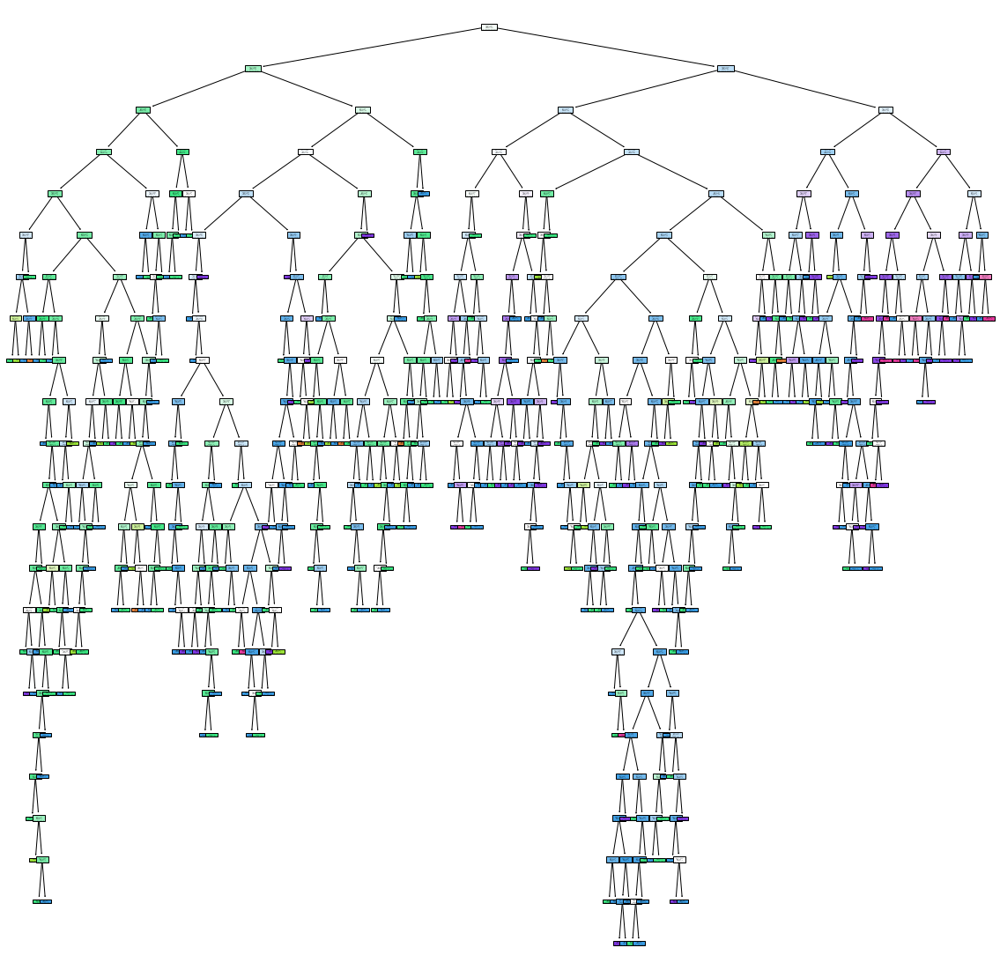

In [18]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, filled=True)

In [19]:
df1 = df.head(500)

In [20]:
x1 = df1.drop(columns='quality')

In [21]:
y1 = df1.quality

In [22]:
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x1, y1)

DecisionTreeClassifier()

[Text(0.45538651315789475, 0.9722222222222222, 'alcohol <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]\nclass = 5'),
 Text(0.28653665413533835, 0.9166666666666666, 'total sulfur dioxide <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]\nclass = 5'),
 Text(0.18021616541353383, 0.8611111111111112, 'citric acid <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]\nclass = 5'),
 Text(0.08223684210526316, 0.8055555555555556, 'alcohol <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]\nclass = 5'),
 Text(0.022556390977443608, 0.75, 'sulphates <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]\nclass = 6'),
 Text(0.015037593984962405, 0.6944444444444444, 'sulphates <= 0.515\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]\nclass = 4'),
 Text(0.007518796992481203, 0.6388888888888888, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]\nclass = 4'),
 Text(0.022556390977443608, 0.6388888888888888, 'gini

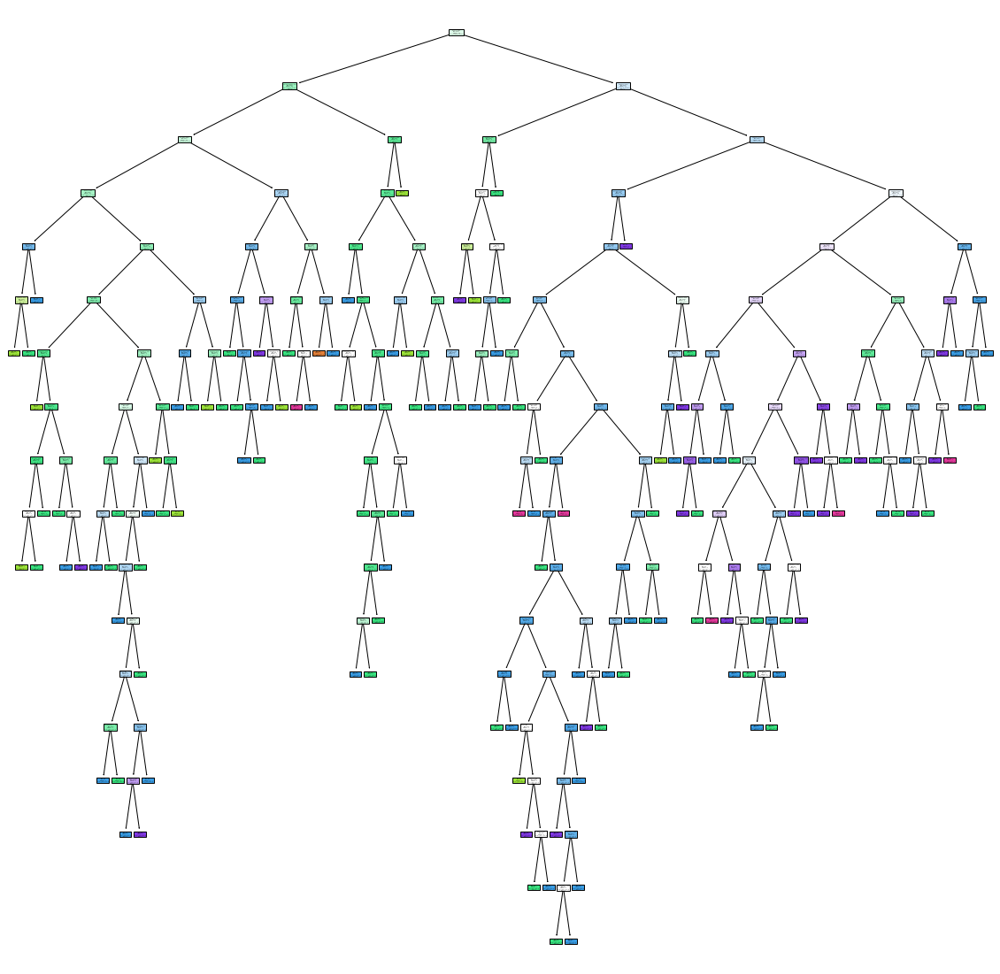

In [23]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True, class_names=[str(i) for i in set(y1)], feature_names=x1.columns)

In [24]:
path = dt_model1.cost_complexity_pruning_path(x1, y1)
ccp_alpha = path['ccp_alphas']

In [25]:
ccp_alpha

array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
       0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.00203333, 0.00261111, 0.00262769,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00271329, 0.00272222,
       0.00283333, 0.00285714, 0.003     , 0.003     , 0.003     ,
       0.003     , 0.00304762, 0.00305051, 0.00308418, 0.00328205,
       0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
       0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
       0.00373333, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
       0.00404444, 0.00428571, 0.00428571, 0.00437662, 0.00462338,
       0.00465709, 0.00466667, 0.0048    , 0.00487179, 0.00504242,
       0.00508235, 0.00509091, 0.00510606, 0.00516667, 0.00568485,
       0.00589394, 0.00656364, 0.00671079, 0.0067591 , 0.00688

In [26]:
dt_model2 = []
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1, y1)
    dt_model2.append(dt_m)

In [27]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 DecisionTreeClassifier(ccp_alpha=0.00266666666

In [28]:
train_score = [i.score(x1, y1) for i in dt_model2]

In [29]:
test_score = [i.score(x_test, y_test) for i in dt_model2]

In [30]:
train_score

[1.0,
 1.0,
 0.998,
 0.996,
 0.994,
 0.986,
 0.986,
 0.964,
 0.96,
 0.966,
 0.96,
 0.96,
 0.962,
 0.962,
 0.958,
 0.96,
 0.96,
 0.96,
 0.95,
 0.948,
 0.93,
 0.932,
 0.93,
 0.93,
 0.932,
 0.93,
 0.928,
 0.932,
 0.93,
 0.928,
 0.922,
 0.922,
 0.91,
 0.916,
 0.914,
 0.916,
 0.916,
 0.912,
 0.906,
 0.902,
 0.898,
 0.902,
 0.898,
 0.892,
 0.892,
 0.888,
 0.882,
 0.882,
 0.884,
 0.882,
 0.878,
 0.868,
 0.866,
 0.858,
 0.856,
 0.858,
 0.858,
 0.856,
 0.842,
 0.838,
 0.834,
 0.818,
 0.824,
 0.81,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.558,
 0.478]

In [31]:
test_score

[0.615625,
 0.6125,
 0.609375,
 0.596875,
 0.621875,
 0.6,
 0.6125,
 0.621875,
 0.596875,
 0.625,
 0.609375,
 0.609375,
 0.61875,
 0.609375,
 0.6,
 0.615625,
 0.63125,
 0.6125,
 0.628125,
 0.640625,
 0.60625,
 0.6125,
 0.609375,
 0.60625,
 0.61875,
 0.621875,
 0.63125,
 0.615625,
 0.6125,
 0.60625,
 0.60625,
 0.59375,
 0.60625,
 0.61875,
 0.6,
 0.603125,
 0.603125,
 0.59375,
 0.603125,
 0.621875,
 0.61875,
 0.625,
 0.625,
 0.63125,
 0.621875,
 0.625,
 0.628125,
 0.63125,
 0.61875,
 0.615625,
 0.6125,
 0.61875,
 0.61875,
 0.625,
 0.63125,
 0.625,
 0.621875,
 0.625,
 0.615625,
 0.615625,
 0.6125,
 0.6125,
 0.621875,
 0.615625,
 0.6125,
 0.61875,
 0.60625,
 0.6125,
 0.60625,
 0.6,
 0.609375,
 0.603125,
 0.609375,
 0.609375,
 0.609375,
 0.6125,
 0.6125,
 0.621875,
 0.61875,
 0.61875,
 0.609375,
 0.603125,
 0.59375,
 0.584375,
 0.584375,
 0.56875,
 0.58125,
 0.58125,
 0.58125,
 0.565625,
 0.43125]

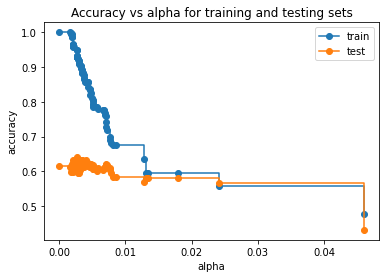

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

In [32]:
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy vs alpha for training and testing sets')
ax.plot(ccp_alpha, train_score, marker='o', label='train', drawstyle='steps-post')
ax.plot(ccp_alpha, test_score, marker='o', label='test', drawstyle='steps-post')
ax.legend()
plt.show()
plt.figure(figsize=(10,10))

In [33]:
dt_model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.014)
dt_model_ccp.fit(x1, y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.5, 0.8333333333333334, 'alcohol <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]\nclass = 5'),
 Text(0.25, 0.5, 'total sulfur dioxide <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]\nclass = 5'),
 Text(0.125, 0.16666666666666666, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]\nclass = 5'),
 Text(0.375, 0.16666666666666666, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]\nclass = 5'),
 Text(0.75, 0.5, 'sulphates <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]\nclass = 6'),
 Text(0.625, 0.16666666666666666, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]\nclass = 5'),
 Text(0.875, 0.16666666666666666, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]\nclass = 6')]

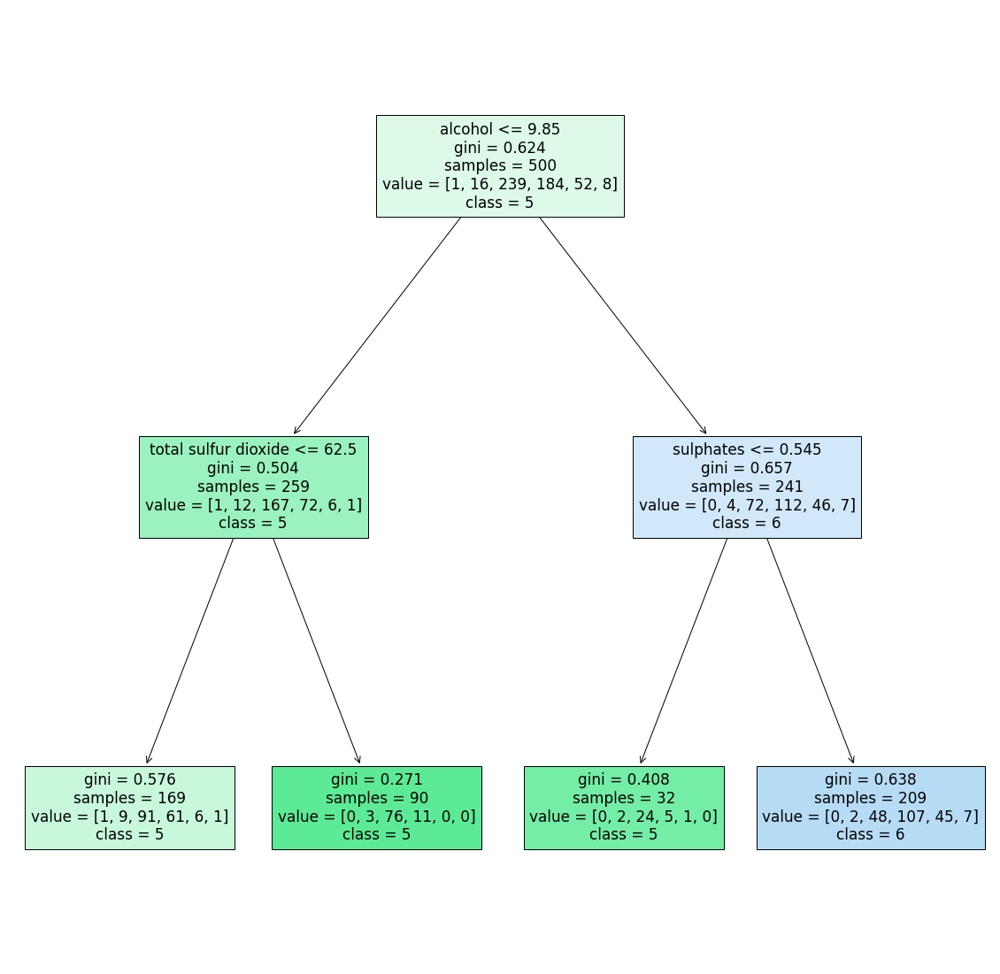

In [34]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp, filled=True, class_names=[str(i) for i in y1], feature_names=x1.columns)

In [35]:
dt_model_ccp.score(x1, y1)

0.596

In [36]:
dt_model_ccp.score(x_test, y_test)

0.58125

In [37]:
grid_param = {'criterion':['gini', 'entropy'], 
              'splitter':['best', 'random'],
              'max_depth':range(2,40,1),
              'min_samples_split':range(2,10,1),
              'min_samples_leaf':range(1,10,1),
              }

In [38]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp, param_grid=grid_param, cv=5, n_jobs=-1)

In [39]:
grid_ccp.fit(x1, y1)

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_split.py:680: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  UserWarning,


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [40]:
grid_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'splitter': 'random'}

In [41]:
dt_ccp_new = DecisionTreeClassifier(criterion='entropy', max_depth=15,min_samples_leaf=2,min_samples_split=2,splitter='random', ccp_alpha=0.014)

In [42]:
dt_ccp_new.fit(x1, y1)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=15,
                       min_samples_leaf=2, splitter='random')

In [43]:
dt_ccp_new.score(x1, y1)

0.654

In [44]:
dt_ccp_new.score(x_test, y_test)

0.575

In [45]:
pred = dt_ccp_new.predict(x_train)

In [46]:
confusion_matrix(y_train, pred)

array([[  0,   0,   4,   3,   1,   0],
       [  0,   0,  25,  15,   1,   0],
       [  0,   0, 292, 240,  11,   0],
       [  0,   0,  97, 394,  16,   0],
       [  0,   0,   6, 140,  17,   0],
       [  0,   0,   0,  15,   2,   0]])

In [47]:
x = df.drop(columns=['quality'])

In [48]:
y = df.quality

# Model built using Bagging

In [49]:
from sklearn.ensemble import BaggingClassifier

In [50]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=0)

In [51]:
bag_dt = BaggingClassifier(DecisionTreeClassifier(), n_estimators=100)

In [52]:
bag_dt.fit(x_train, y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=100)

In [53]:
bag_dt.predict(x_test)

array([6, 5, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 4, 5, 7, 7, 5, 5, 6, 6, 5,
       6, 7, 5, 5, 5, 7, 5, 6, 5, 6, 6, 5, 7, 7, 5, 6, 6, 6, 5, 7, 6, 7,
       6, 5, 5, 6, 5, 6, 5, 5, 6, 6, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 5, 6,
       5, 5, 7, 6, 6, 5, 5, 5, 6, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 6, 6, 5,
       5, 5, 5, 6, 6, 5, 7, 6, 6, 5, 5, 5, 7, 6, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 8, 5, 6, 6, 6, 7, 6, 6, 5, 5, 5, 5, 7, 7, 5, 5, 6, 6, 6, 5,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 5, 5, 6, 8, 6, 5, 5, 6, 5, 5, 5,
       6, 6, 6, 6, 6, 6, 6, 6, 7, 5, 5, 5, 6, 6, 6, 6, 6, 5, 5, 7, 5, 6,
       7, 7, 7, 5, 5, 7, 6, 6, 7, 5, 5, 6, 5, 6, 6, 5, 6, 6, 5, 5, 5, 6,
       6, 5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 7, 5, 6, 5, 7, 6, 5,
       5, 5, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 7, 6, 6, 7, 7, 6, 5, 6,
       5, 5, 6, 5, 5, 5, 5, 7, 5, 5, 5, 6, 5, 5, 5, 5, 5, 7, 5, 6, 5, 6,
       5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 6, 6, 6, 6, 6, 7, 5, 7, 5, 6, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 6,

In [54]:
bag_dt.base_estimator_

DecisionTreeClassifier()

In [55]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8])

In [56]:
bag_dt.estimator_params

()

In [57]:
from sklearn.neighbors import KNeighborsClassifier

In [58]:
bag_knn = BaggingClassifier(KNeighborsClassifier(6), n_estimators=10)

In [59]:
bag_knn.fit(x_train, y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6))

In [60]:
bag_knn.predict(x_test)

array([5, 6, 7, 6, 6, 5, 6, 6, 6, 6, 5, 6, 5, 5, 6, 6, 7, 6, 6, 5, 6, 6,
       6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 6, 6, 6, 7, 5, 6, 6, 6, 6, 7, 6, 5,
       5, 6, 5, 6, 5, 5, 6, 5, 7, 6, 6, 6, 5, 5, 7, 5, 5, 6, 6, 5, 6, 7,
       6, 7, 8, 7, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 5, 4, 6, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 7, 5, 6, 6, 5, 6, 5, 6, 6, 5,
       6, 5, 6, 6, 5, 7, 5, 7, 7, 6, 5, 7, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5,
       5, 6, 6, 5, 6, 5, 6, 5, 7, 5, 5, 6, 5, 6, 6, 7, 6, 6, 5, 5, 6, 6,
       5, 6, 5, 6, 5, 6, 6, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 7, 6, 7, 7, 6,
       7, 7, 7, 5, 5, 6, 6, 6, 7, 5, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 6, 6, 5, 5, 6, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 5,
       5, 5, 6, 6, 6, 5, 6, 5, 6, 4, 5, 6, 5, 5, 7, 6, 6, 5, 7, 6, 6, 6,
       6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 5, 6, 5, 6, 6, 7, 6, 6, 7, 6, 6, 5, 7, 5, 5,
       5, 5, 6, 6, 6, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6,

In [61]:
from sklearn.ensemble import RandomForestClassifier

In [62]:
rf = RandomForestClassifier(n_estimators=5)

In [63]:
rf.fit(x_train, y_train)

RandomForestClassifier(n_estimators=5)

In [64]:
rf.score(x_test, y_test)

0.6325

In [65]:
bag_dt.score(x_test, y_test)

0.705

In [66]:
bag_knn.score(x_test, y_test)

0.4925

In [67]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=70914888),
 DecisionTreeClassifier(max_features='auto', random_state=1693004069),
 DecisionTreeClassifier(max_features='auto', random_state=349932474),
 DecisionTreeClassifier(max_features='auto', random_state=217320764),
 DecisionTreeClassifier(max_features='auto', random_state=19510494)]

In [68]:
rf.estimators_[0]

DecisionTreeClassifier(max_features='auto', random_state=70914888)

[Text(0.750905360522995, 0.9761904761904762, 'X[5] <= 32.5\ngini = 0.644\nsamples = 760\nvalue = [13, 33, 502, 486, 151, 14]'),
 Text(0.5354618707936063, 0.9285714285714286, 'X[10] <= 10.525\ngini = 0.644\nsamples = 704\nvalue = [10, 33, 443, 467, 140, 13]'),
 Text(0.31775141965787995, 0.8809523809523809, 'X[6] <= 82.5\ngini = 0.549\nsamples = 428\nvalue = [4, 21, 376, 245, 24, 0]'),
 Text(0.13297900308468874, 0.8333333333333334, 'X[3] <= 1.85\ngini = 0.576\nsamples = 348\nvalue = [4, 19, 272, 228, 24, 0]'),
 Text(0.0532809871003926, 0.7857142857142857, 'X[1] <= 0.345\ngini = 0.536\nsamples = 90\nvalue = [2, 5, 88, 39, 8, 0]'),
 Text(0.024677509814918678, 0.7380952380952381, 'X[1] <= 0.305\ngini = 0.266\nsamples = 14\nvalue = [0, 0, 0, 16, 3, 0]'),
 Text(0.020190689848569827, 0.6904761904761905, 'gini = 0.0\nsamples = 9\nvalue = [0, 0, 0, 13, 0, 0]'),
 Text(0.029164329781267526, 0.6904761904761905, 'X[0] <= 7.55\ngini = 0.5\nsamples = 5\nvalue = [0, 0, 0, 3, 3, 0]'),
 Text(0.0246775098

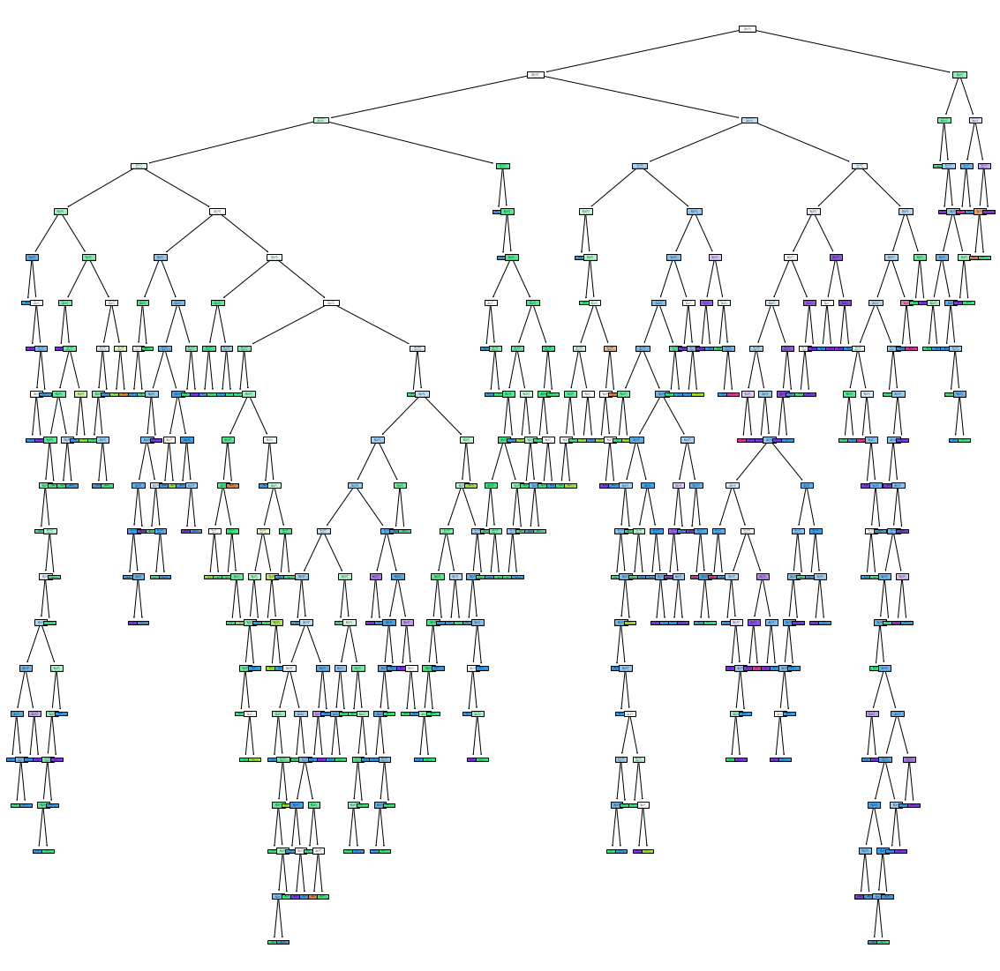

In [69]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf.estimators_[0], filled=True)

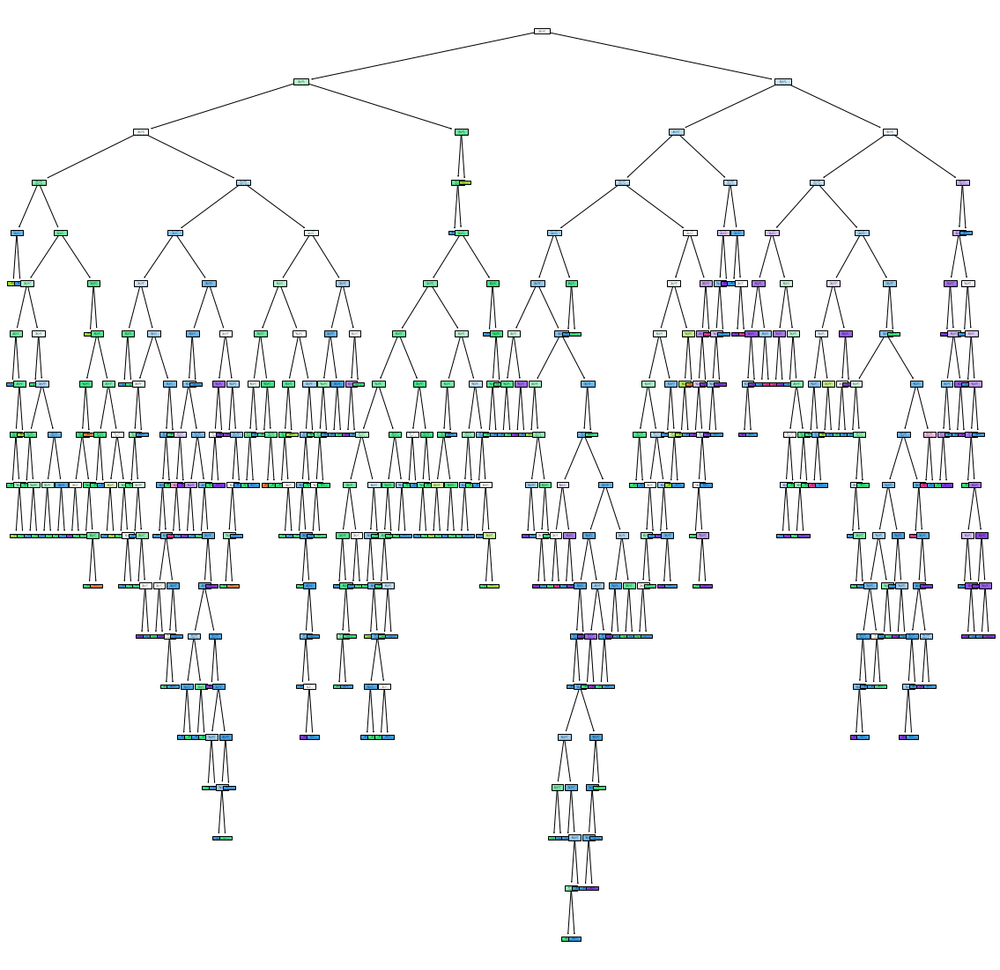

In [70]:
plt.figure(figsize=(20, 20))
for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i], filled=True)

In [71]:
grid_param = {
    'n_estimators':[5,10,50,100,120,150],
    'criterion':['gini','entropy'],
    'max_depth':range(10),
    'min_samples_leaf':range(10)
}

In [72]:
grid_search_rf = GridSearchCV(param_grid=grid_param, cv=10, n_jobs=-1, verbose=1, estimator=rf)

In [73]:
grid_search_rf.fit(x_train, y_train)

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_split.py:680: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  UserWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
2280 fits failed out of a total of 12000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1200 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 467, in fit
    for i, t in enumerate(tr

GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=5), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 50, 100, 120, 150]},
             verbose=1)

In [74]:
grid_search_rf.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'n_estimators': 150}

In [75]:
rf_new = RandomForestClassifier(criterion='entropy', max_depth=9, min_samples_leaf=1, n_estimators=120)

In [76]:
rf_new.fit(x_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=120)

In [77]:
rf_new.score(x_test, y_test)

0.68

[Text(0.5135387073863636, 0.95, 'X[9] <= 0.645\nentropy = 1.706\nsamples = 756\nvalue = [5, 49, 506, 476, 155, 8]'),
 Text(0.2604758522727273, 0.85, 'X[5] <= 14.5\nentropy = 1.561\nsamples = 433\nvalue = [5, 42, 366, 236, 34, 3]'),
 Text(0.14488636363636365, 0.75, 'X[1] <= 0.752\nentropy = 1.733\nsamples = 221\nvalue = [4, 35, 167, 121, 28, 0]'),
 Text(0.07102272727272728, 0.65, 'X[4] <= 0.047\nentropy = 1.587\nsamples = 184\nvalue = [0, 15, 138, 109, 28, 0]'),
 Text(0.06534090909090909, 0.55, 'entropy = 0.0\nsamples = 2\nvalue = [0, 0, 0, 7, 0, 0]'),
 Text(0.07670454545454546, 0.55, 'X[3] <= 1.85\nentropy = 1.591\nsamples = 182\nvalue = [0, 15, 138, 102, 28, 0]'),
 Text(0.03125, 0.45, 'X[10] <= 10.05\nentropy = 1.079\nsamples = 43\nvalue = [0, 1, 46, 5, 8, 0]'),
 Text(0.02556818181818182, 0.35, 'entropy = 0.0\nsamples = 20\nvalue = [0, 0, 29, 0, 0, 0]'),
 Text(0.036931818181818184, 0.35, 'X[3] <= 1.55\nentropy = 1.564\nsamples = 23\nvalue = [0, 1, 17, 5, 8, 0]'),
 Text(0.0227272727272

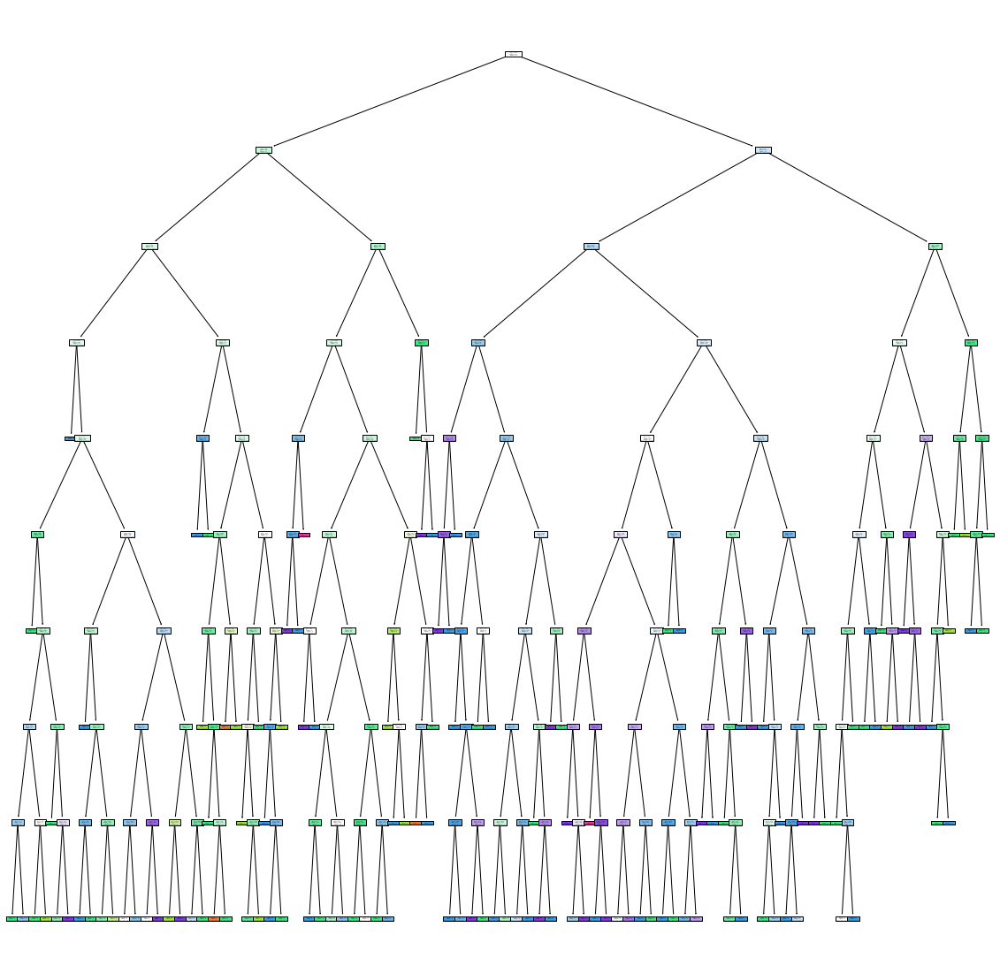

In [78]:
plt.figure(figsize=(20, 20))
tree.plot_tree(rf_new.estimators_[0], filled=True)